# Vehicle detection project

## 1. Import needed libraries

In [22]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from scipy.ndimage.measurements import label
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# if you are using scikit-learn >= 0.18 then use this:
from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split

## 2. Load images and check the dataset properties

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


Text(0.5,1,'Example Not-car Image')

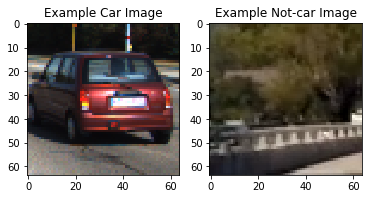

In [68]:
# images are divided up into vehicles and non-vehicles

vehicles = glob.glob('../vehicles/**/*.png', recursive=True)
non_vehicles = glob.glob('../non-vehicles/**/*.png', recursive=True)

cars = []
notcars = []

for image in vehicles:
    cars.append(image)

for image in non_vehicles:
    notcars.append(image)

# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    # Return data_dict
    return data_dict

data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')

## 3. Define all helper functions required

In [42]:
# Define a function to return HOG features and visualization
# Features will always be the first element of the return
# Image data will be returned as the second element if visualize= True
# Otherwise there is no second return element
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  block_norm= 'L2-Hys',
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       block_norm= 'L2-Hys',
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features
    
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32):#, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)#, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)#, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)#, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.concatenate(hog_features)
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

# Define a function you will pass an image
# and the list of windows to be searched (output of slide_windows())
# and a trained classifier (eg. linear SVM)
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img,cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
            
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

## 4. Visualise some random car and non-car images, and their HOG representations

/Users/s89970/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


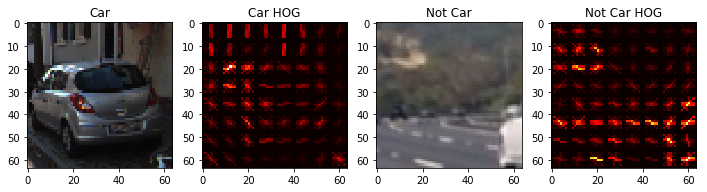

In [25]:
%matplotlib inline

# Choose a random car and not-car image
car_ind = np.random.randint(0,len(cars))
notcar_ind = np.random.randint(0,len(notcars))

car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

### Tweak these parameters and see how the results change.
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

# Extract features & resulting HOG image for both car and non car examples
car_features, car_hog_image = single_img_features(car_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

# Draw the original and HOG images for each car / non-car
images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['Car', 'Car HOG', 'Not Car', 'Not Car HOG']
fig = plt.figure(figsize=(12,3))
visualize(fig,1,4,images,titles)

#Todo: could also look at histo & spatial binning here too

## 5. Try training our linear SVN on this data, split into valid test and training sets to see what accuracy we get (and a chance to tweak parameters and see whether we can improve it!)

In [31]:
### Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

t=time.time()
#n_samples = 1000
#random_idxs = np.random.randint(0,len(cars), n_samples)
test_cars = cars #np.array(cars)[random_idxs]
test_notcars = notcars #np.array(notcars)[random_idxs]

car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

/Users/s89970/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


118.93804001808167 Seconds to compute features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
6.64 Seconds to train SVC...
Test Accuracy of SVC =  0.9913


## 6. Try the trained classifier to identify vehicles on our test images using sliding window technique

/Users/s89970/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


0.743297815322876 secs to process one image searching 100 windows
0.664125919342041 secs to process one image searching 100 windows
0.603938102722168 secs to process one image searching 100 windows
0.5793330669403076 secs to process one image searching 100 windows
0.564824104309082 secs to process one image searching 100 windows
0.6066370010375977 secs to process one image searching 100 windows


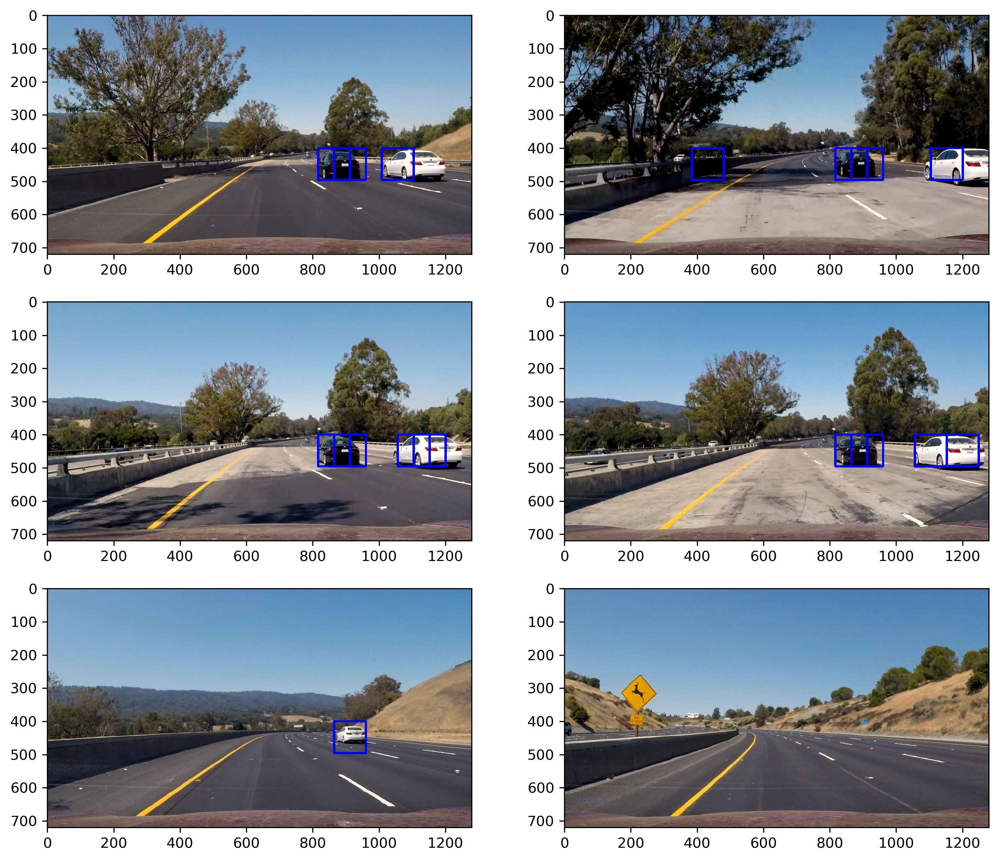

In [41]:
test_path = 'test_images/*.jpg'
test_images = glob.glob(test_path)
images = []
titles = []

y_start_stop = [400,656]
overlap = 0.5

for test_image in test_images:
    t1 = time.time()
    img = mpimg.imread(test_image)
    draw_img = np.copy(img)
    # Reading .jpg so we have to now scale by 255!!  :/
    img = img.astype(np.float32)/255
    
    # Grab the list of sliding window locations
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(96, 96), xy_overlap=(overlap, overlap))

    # Find the hot windows (those the classifier believes contain a vehicle!)
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat) 

    # Draw bounding boxes around the identified vehicle locations
    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6) 
    
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'secs to process one image searching', len(windows), 'windows')
    
fig = plt.figure(figsize=(12,18),dpi=300)
visualize(fig, 5, 2, images, titles)
    

## 7. Now define the additional functions for HOG sub-sampling of the image, creation of heatmaps and drawing the resulting bounding box based on heatmaps

In [50]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    img_boxes = []
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return draw_img, img_boxes

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

## 8. Try out these new functions on the test images and output the detections, the heatmap and the resulting single bounding box drawn from the heatmap

/Users/s89970/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


0.44778895378112793 secs to process one image searching 100 windows
0.4437880516052246 secs to process one image searching 100 windows
0.43566393852233887 secs to process one image searching 100 windows
0.41889500617980957 secs to process one image searching 100 windows
0.40652894973754883 secs to process one image searching 100 windows
0.4120330810546875 secs to process one image searching 100 windows


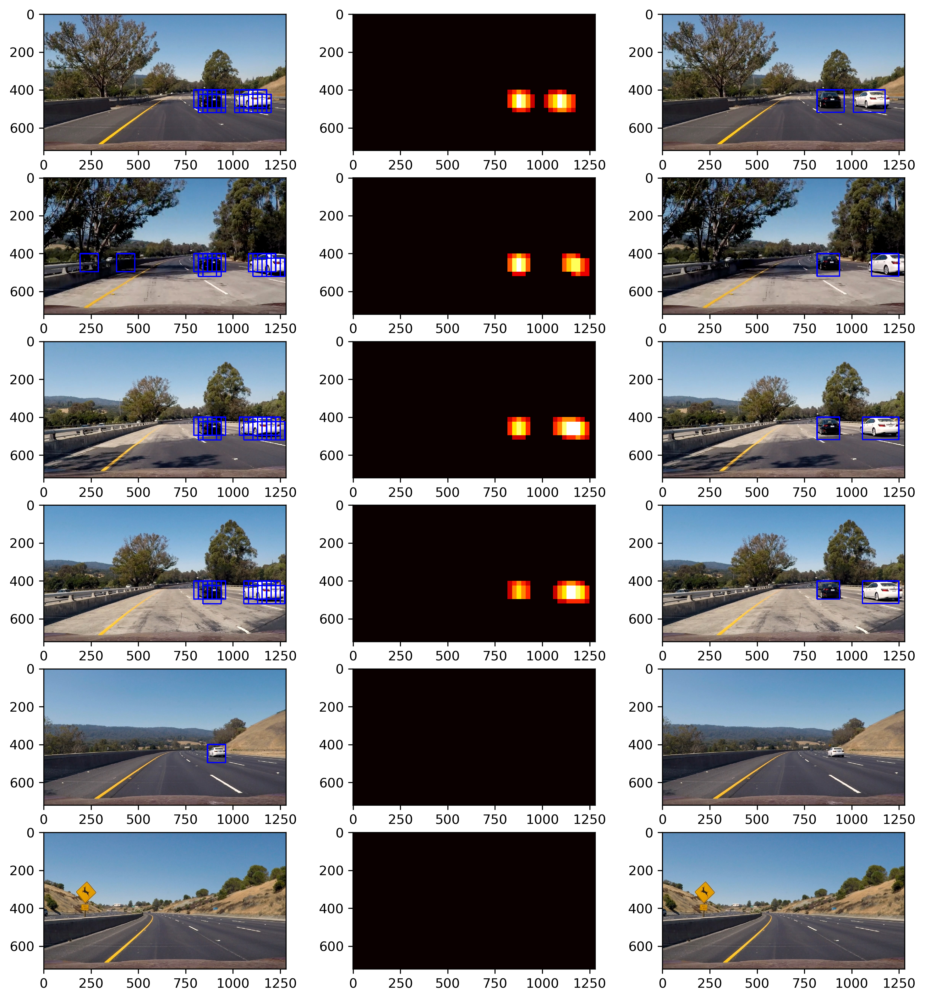

In [58]:
test_path = 'test_images/*.jpg'
test_images = glob.glob(test_path)
images = []
titles = []
boxes = []

ystart = 400
ystop = 656
scale = 1.5

for test_image in test_images:
    t1 = time.time()
    img = mpimg.imread(test_image)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    out_img, boxes = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    # Add heat to each box in box list
    heat = add_heat(heat,boxes)
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    images.append(out_img)
    titles.append('')
    images.append(heatmap)
    titles.append('')
    images.append(draw_img)
    titles.append('')
    print(time.time()-t1, 'secs to process one image searching', len(windows), 'windows')
    
fig = plt.figure(figsize=(12,18),dpi=300)
visualize(fig, 8, 3, images, titles)

## 9. Turn this main pipeline into a function that can run on each frame of video and show the resulting output video

In [104]:
def process_image(img):
    
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    out_img, boxes = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # Add the newly detected boxes to a running list from the last 10 images
    stored_box_list.append(boxes)
    if len(stored_box_list) > 10:
        stored_box_list.pop(0)
    
    # Flatten into a list of all detections from the last 10 images to draw a combined heatmap
    flat_box_list = []
    for sublist in stored_box_list:
        for item in sublist:
            flat_box_list.append(item)
    
    # Add heat to each box in flattened box list
    heat = add_heat(heat,flat_box_list)
    # Apply threshold to help remove false positives that were triggered less than 5 times
    heat = apply_threshold(heat,5)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [105]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

stored_box_list = []

test_output = 'project_video_output.mp4'
#clip = VideoFileClip("test_video.mp4")
#clip = VideoFileClip("project_video.mp4").subclip(37,43) # test to reduce shadow false positives
clip = VideoFileClip("project_video.mp4")
test_clip = clip.fl_image(process_image)
test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test_output.mp4
[MoviePy] Writing video test_output.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<09:33,  2.20it/s]

  0%|          | 2/1261 [00:00<09:27,  2.22it/s]

  0%|          | 3/1261 [00:01<09:06,  2.30it/s]

  0%|          | 4/1261 [00:01<09:04,  2.31it/s]

  0%|          | 5/1261 [00:02<08:56,  2.34it/s]

  0%|          | 6/1261 [00:02<08:50,  2.36it/s]

  1%|          | 7/1261 [00:02<08:45,  2.39it/s]

  1%|          | 8/1261 [00:03<08:39,  2.41it/s]

  1%|          | 9/1261 [00:03<08:35,  2.43it/s]

  1%|          | 10/1261 [00:04<08:35,  2.43it/s]

  1%|          | 11/1261 [00:04<08:40,  2.40it/s]

  1%|          | 12/1261 [00:05<08:41,  2.39it/s]

  1%|          | 13/1261 [00:05<08:39,  2.40it/s]

  1%|          | 14/1261 [00:05<08:39,  2.40it/s]

  1%|          | 15/1261 [00:06<08:44,  2.38it/s]

  1%|▏         | 16/1261 [00:07<09:11,  2.26it/s]

  1%|▏         | 17/1261 [00:07<09:19,  2.22it/s]

  1%|▏         | 18/1261 [00:08<09:16,  2.24it/s]

  2%|▏         | 19/1261 [00:08<09:13,  2.24it/

 11%|█▏        | 143/1261 [01:01<08:02,  2.32it/s]

 11%|█▏        | 144/1261 [01:02<08:01,  2.32it/s]

 11%|█▏        | 145/1261 [01:02<08:02,  2.31it/s]

 12%|█▏        | 146/1261 [01:03<08:04,  2.30it/s]

 12%|█▏        | 147/1261 [01:03<08:03,  2.30it/s]

 12%|█▏        | 148/1261 [01:04<08:02,  2.31it/s]

 12%|█▏        | 149/1261 [01:04<08:02,  2.31it/s]

 12%|█▏        | 150/1261 [01:05<08:02,  2.30it/s]

 12%|█▏        | 151/1261 [01:05<08:01,  2.31it/s]

 12%|█▏        | 152/1261 [01:05<08:00,  2.31it/s]

 12%|█▏        | 153/1261 [01:06<08:00,  2.31it/s]

 12%|█▏        | 154/1261 [01:06<07:59,  2.31it/s]

 12%|█▏        | 155/1261 [01:07<07:58,  2.31it/s]

 12%|█▏        | 156/1261 [01:07<07:58,  2.31it/s]

 12%|█▏        | 157/1261 [01:07<07:57,  2.31it/s]

 13%|█▎        | 158/1261 [01:08<07:56,  2.31it/s]

 13%|█▎        | 159/1261 [01:08<07:56,  2.31it/s]

 13%|█▎        | 160/1261 [01:09<07:56,  2.31it/s]

 13%|█▎        | 161/1261 [01:09<07:56,  2.31it/s]

 13%|█▎     

 23%|██▎       | 284/1261 [02:02<07:01,  2.32it/s]

 23%|██▎       | 285/1261 [02:02<07:01,  2.32it/s]

 23%|██▎       | 286/1261 [02:03<07:00,  2.32it/s]

 23%|██▎       | 287/1261 [02:03<06:59,  2.32it/s]

 23%|██▎       | 288/1261 [02:04<06:59,  2.32it/s]

 23%|██▎       | 289/1261 [02:04<06:58,  2.32it/s]

 23%|██▎       | 290/1261 [02:04<06:58,  2.32it/s]

 23%|██▎       | 291/1261 [02:05<06:57,  2.32it/s]

 23%|██▎       | 292/1261 [02:05<06:57,  2.32it/s]

 23%|██▎       | 293/1261 [02:06<06:56,  2.32it/s]

 23%|██▎       | 294/1261 [02:06<06:56,  2.32it/s]

 23%|██▎       | 295/1261 [02:06<06:55,  2.32it/s]

 23%|██▎       | 296/1261 [02:07<06:55,  2.32it/s]

 24%|██▎       | 297/1261 [02:07<06:54,  2.32it/s]

 24%|██▎       | 298/1261 [02:08<06:54,  2.32it/s]

 24%|██▎       | 299/1261 [02:08<06:53,  2.33it/s]

 24%|██▍       | 300/1261 [02:08<06:53,  2.33it/s]

 24%|██▍       | 301/1261 [02:09<06:52,  2.33it/s]

 24%|██▍       | 302/1261 [02:09<06:52,  2.33it/s]

 24%|██▍    

 34%|███▎      | 425/1261 [03:01<05:57,  2.34it/s]

 34%|███▍      | 426/1261 [03:02<05:57,  2.34it/s]

 34%|███▍      | 427/1261 [03:02<05:56,  2.34it/s]

 34%|███▍      | 428/1261 [03:03<05:56,  2.34it/s]

 34%|███▍      | 429/1261 [03:03<05:56,  2.34it/s]

 34%|███▍      | 430/1261 [03:04<05:55,  2.34it/s]

 34%|███▍      | 431/1261 [03:04<05:55,  2.34it/s]

 34%|███▍      | 432/1261 [03:04<05:54,  2.34it/s]

 34%|███▍      | 433/1261 [03:05<05:54,  2.34it/s]

 34%|███▍      | 434/1261 [03:05<05:53,  2.34it/s]

 34%|███▍      | 435/1261 [03:06<05:53,  2.34it/s]

 35%|███▍      | 436/1261 [03:06<05:52,  2.34it/s]

 35%|███▍      | 437/1261 [03:06<05:52,  2.34it/s]

 35%|███▍      | 438/1261 [03:07<05:52,  2.34it/s]

 35%|███▍      | 439/1261 [03:07<05:51,  2.34it/s]

 35%|███▍      | 440/1261 [03:08<05:51,  2.34it/s]

 35%|███▍      | 441/1261 [03:08<05:50,  2.34it/s]

 35%|███▌      | 442/1261 [03:09<05:50,  2.34it/s]

 35%|███▌      | 443/1261 [03:09<05:49,  2.34it/s]

 35%|███▌   

 45%|████▍     | 566/1261 [04:03<04:59,  2.32it/s]

 45%|████▍     | 567/1261 [04:04<04:58,  2.32it/s]

 45%|████▌     | 568/1261 [04:04<04:58,  2.32it/s]

 45%|████▌     | 569/1261 [04:04<04:57,  2.32it/s]

 45%|████▌     | 570/1261 [04:05<04:57,  2.32it/s]

 45%|████▌     | 571/1261 [04:05<04:56,  2.32it/s]

 45%|████▌     | 572/1261 [04:06<04:56,  2.32it/s]

 45%|████▌     | 573/1261 [04:06<04:56,  2.32it/s]

 46%|████▌     | 574/1261 [04:07<04:55,  2.32it/s]

 46%|████▌     | 575/1261 [04:07<04:55,  2.32it/s]

 46%|████▌     | 576/1261 [04:08<04:55,  2.32it/s]

 46%|████▌     | 577/1261 [04:08<04:54,  2.32it/s]

 46%|████▌     | 578/1261 [04:08<04:54,  2.32it/s]

 46%|████▌     | 579/1261 [04:09<04:53,  2.32it/s]

 46%|████▌     | 580/1261 [04:09<04:53,  2.32it/s]

 46%|████▌     | 581/1261 [04:10<04:52,  2.32it/s]

 46%|████▌     | 582/1261 [04:10<04:52,  2.32it/s]

 46%|████▌     | 583/1261 [04:10<04:51,  2.32it/s]

 46%|████▋     | 584/1261 [04:11<04:51,  2.32it/s]

 46%|████▋  

 56%|█████▌    | 707/1261 [05:03<03:57,  2.33it/s]

 56%|█████▌    | 708/1261 [05:03<03:57,  2.33it/s]

 56%|█████▌    | 709/1261 [05:04<03:56,  2.33it/s]

 56%|█████▋    | 710/1261 [05:04<03:56,  2.33it/s]

 56%|█████▋    | 711/1261 [05:05<03:56,  2.33it/s]

 56%|█████▋    | 712/1261 [05:05<03:55,  2.33it/s]

 57%|█████▋    | 713/1261 [05:05<03:55,  2.33it/s]

 57%|█████▋    | 714/1261 [05:06<03:54,  2.33it/s]

 57%|█████▋    | 715/1261 [05:06<03:54,  2.33it/s]

 57%|█████▋    | 716/1261 [05:07<03:53,  2.33it/s]

 57%|█████▋    | 717/1261 [05:07<03:53,  2.33it/s]

 57%|█████▋    | 718/1261 [05:07<03:52,  2.33it/s]

 57%|█████▋    | 719/1261 [05:08<03:52,  2.33it/s]

 57%|█████▋    | 720/1261 [05:08<03:52,  2.33it/s]

 57%|█████▋    | 721/1261 [05:09<03:51,  2.33it/s]

 57%|█████▋    | 722/1261 [05:09<03:51,  2.33it/s]

 57%|█████▋    | 723/1261 [05:09<03:50,  2.33it/s]

 57%|█████▋    | 724/1261 [05:10<03:50,  2.33it/s]

 57%|█████▋    | 725/1261 [05:10<03:49,  2.33it/s]

 58%|█████▊ 

 67%|██████▋   | 848/1261 [06:03<02:56,  2.34it/s]

 67%|██████▋   | 849/1261 [06:03<02:56,  2.34it/s]

 67%|██████▋   | 850/1261 [06:03<02:55,  2.34it/s]

 67%|██████▋   | 851/1261 [06:04<02:55,  2.34it/s]

 68%|██████▊   | 852/1261 [06:04<02:55,  2.34it/s]

 68%|██████▊   | 853/1261 [06:05<02:54,  2.34it/s]

 68%|██████▊   | 854/1261 [06:05<02:54,  2.34it/s]

 68%|██████▊   | 855/1261 [06:05<02:53,  2.34it/s]

 68%|██████▊   | 856/1261 [06:06<02:53,  2.34it/s]

 68%|██████▊   | 857/1261 [06:06<02:52,  2.34it/s]

 68%|██████▊   | 858/1261 [06:07<02:52,  2.34it/s]

 68%|██████▊   | 859/1261 [06:07<02:52,  2.34it/s]

 68%|██████▊   | 860/1261 [06:08<02:51,  2.34it/s]

 68%|██████▊   | 861/1261 [06:08<02:51,  2.34it/s]

 68%|██████▊   | 862/1261 [06:09<02:50,  2.34it/s]

 68%|██████▊   | 863/1261 [06:09<02:50,  2.34it/s]

 69%|██████▊   | 864/1261 [06:09<02:49,  2.34it/s]

 69%|██████▊   | 865/1261 [06:10<02:49,  2.34it/s]

 69%|██████▊   | 866/1261 [06:10<02:49,  2.34it/s]

 69%|██████▉

 78%|███████▊  | 989/1261 [07:07<01:57,  2.32it/s]

 79%|███████▊  | 990/1261 [07:07<01:57,  2.32it/s]

 79%|███████▊  | 991/1261 [07:08<01:56,  2.32it/s]

 79%|███████▊  | 992/1261 [07:08<01:56,  2.32it/s]

 79%|███████▊  | 993/1261 [07:08<01:55,  2.32it/s]

 79%|███████▉  | 994/1261 [07:09<01:55,  2.32it/s]

 79%|███████▉  | 995/1261 [07:09<01:54,  2.32it/s]

 79%|███████▉  | 996/1261 [07:10<01:54,  2.32it/s]

 79%|███████▉  | 997/1261 [07:10<01:53,  2.32it/s]

 79%|███████▉  | 998/1261 [07:10<01:53,  2.32it/s]

 79%|███████▉  | 999/1261 [07:11<01:53,  2.32it/s]

 79%|███████▉  | 1000/1261 [07:11<01:52,  2.32it/s]

 79%|███████▉  | 1001/1261 [07:12<01:52,  2.32it/s]

 79%|███████▉  | 1002/1261 [07:12<01:51,  2.32it/s]

 80%|███████▉  | 1003/1261 [07:12<01:51,  2.32it/s]

 80%|███████▉  | 1004/1261 [07:13<01:50,  2.32it/s]

 80%|███████▉  | 1005/1261 [07:13<01:50,  2.32it/s]

 80%|███████▉  | 1006/1261 [07:14<01:50,  2.32it/s]

 80%|███████▉  | 1007/1261 [07:14<01:49,  2.32it/s]

 80%

 89%|████████▉ | 1128/1261 [08:10<00:57,  2.30it/s]

 90%|████████▉ | 1129/1261 [08:10<00:57,  2.30it/s]

 90%|████████▉ | 1130/1261 [08:10<00:56,  2.30it/s]

 90%|████████▉ | 1131/1261 [08:11<00:56,  2.30it/s]

 90%|████████▉ | 1132/1261 [08:11<00:56,  2.30it/s]

 90%|████████▉ | 1133/1261 [08:12<00:55,  2.30it/s]

 90%|████████▉ | 1134/1261 [08:12<00:55,  2.30it/s]

 90%|█████████ | 1135/1261 [08:13<00:54,  2.30it/s]

 90%|█████████ | 1136/1261 [08:13<00:54,  2.30it/s]

 90%|█████████ | 1137/1261 [08:13<00:53,  2.30it/s]

 90%|█████████ | 1138/1261 [08:14<00:53,  2.30it/s]

 90%|█████████ | 1139/1261 [08:14<00:52,  2.30it/s]

 90%|█████████ | 1140/1261 [08:15<00:52,  2.30it/s]

 90%|█████████ | 1141/1261 [08:15<00:52,  2.30it/s]

 91%|█████████ | 1142/1261 [08:15<00:51,  2.30it/s]

 91%|█████████ | 1143/1261 [08:16<00:51,  2.30it/s]

 91%|█████████ | 1144/1261 [08:16<00:50,  2.30it/s]

 91%|█████████ | 1145/1261 [08:17<00:50,  2.30it/s]

 91%|█████████ | 1146/1261 [08:17<00:49,  2.30

[MoviePy] Done.
[MoviePy] >>>> Video ready: test_output.mp4 



In [107]:
HTML("""
<video width="960" height="540" controls>
  <source src = "{0}">
</video>
""".format(test_output))